![](https://raw.githubusercontent.com/cengineer13/modern_computer_vision/main/LOGO.png)
# **Object Tracking with Optical Flow**

####**In this lesson we'll learn:**
1. How to use Optical Flow in OpenCV
2. Then use Dense Optical Flow

In [1]:
# Our Setup, Import Libaries, Create our Imshow Function and Download our Images
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Define our imshow function 
def imshow(title = "Image", image = None, size = 10):
    w, h = image.shape[0], image.shape[1]
    aspect_ratio = w/h
    plt.figure(figsize=(size * aspect_ratio,size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()

## **The Lucas-Kanade Optical Flow Algorithm**

Optical flow is the pattern of apparent motion of image objects between two consecutive frames caused by the movemement of object or camera. It is 2D vector field where each vector is a displacement vector showing the movement of points from first frame to second. Consider the image below (Image Courtesy: Wikipedia article on Optical Flow).

### Uzbek
Optik oqim - bu ob'ekt yoki kameraning harakati natijasida hosil bo'lgan ikkita ketma-ket kadrlar orasidagi tasvir ob'ektlarining ko'rinadigan harakati. Bu 2D vektor maydoni bo'lib, har bir vektor nuqtalarning birinchi kadrdan ikkinchisiga harakatini ko'rsatadigan siljish vektoridir. 
 <b> Ya'ni kadrdan kadrga o'tganda o'sha pixel boshqa joyga siljiydi. Yani siljish vektorlariga qarab harakatlanish </b>

![](https://upload.wikimedia.org/wikipedia/commons/thumb/1/10/Optical_flow_example_v2.png/440px-Optical_flow_example_v2.png)

It shows a ball moving in 5 consecutive frames. The arrow shows its displacement vector. Optical flow has many applications in areas like :

- Structure from Motion
- Video Compression
- Video Stabilization

Optical flow works on several assumptions:

- The pixel intensities of an object do not change between consecutive frames.
- Neighbouring pixels have similar motion.

Learn more - https://learnopencv.com/optical-flow-in-opencv/

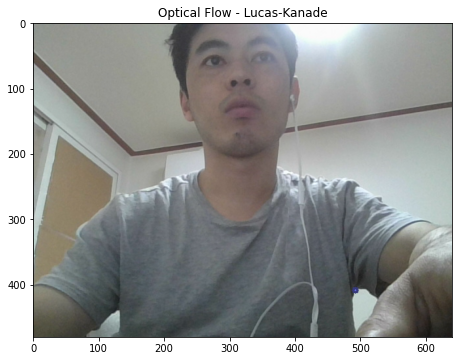

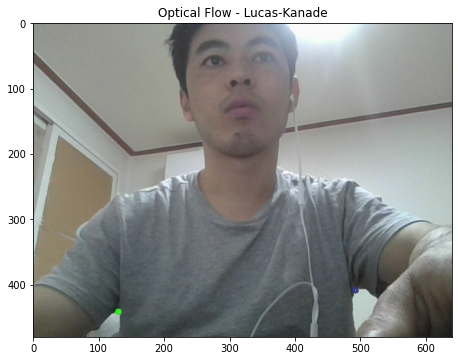

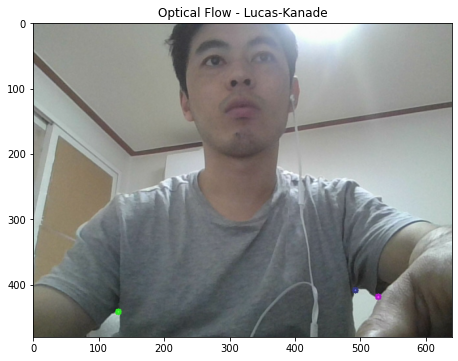

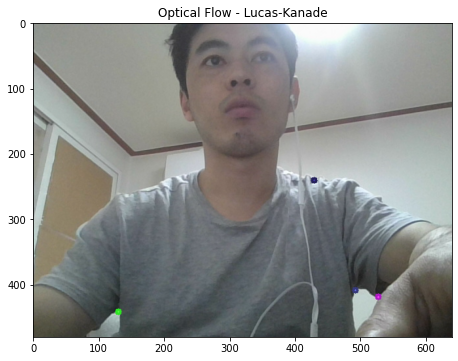

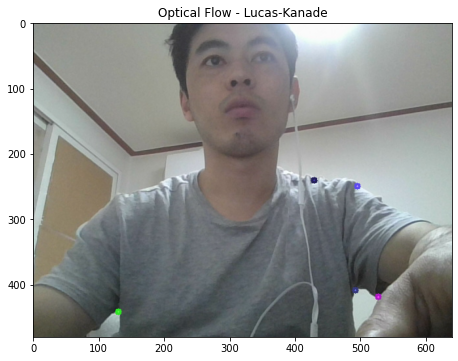

...

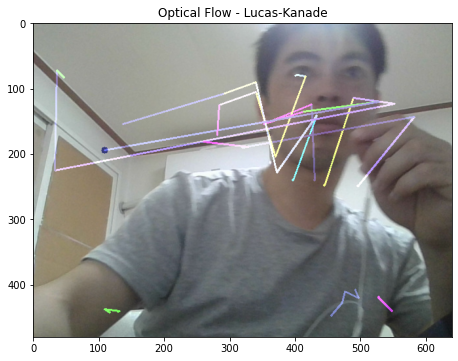

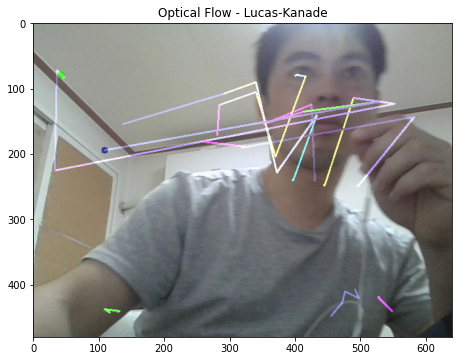

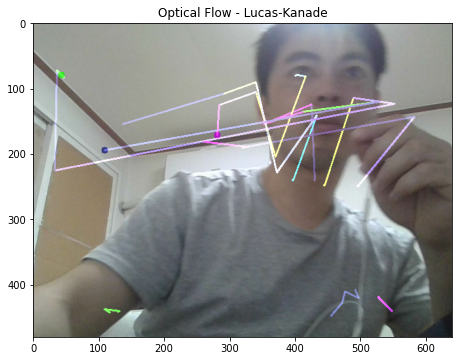

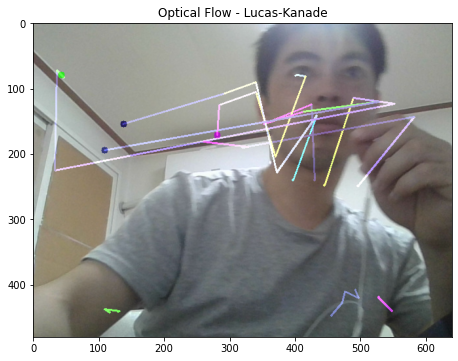

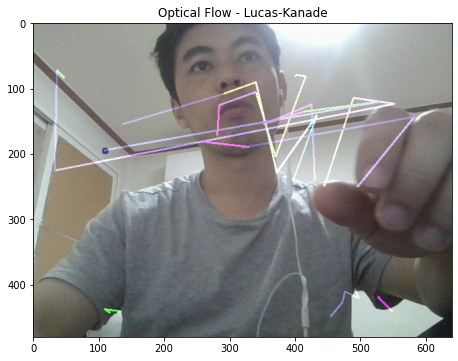

KeyboardInterrupt: 

In [3]:
# Load video stream, short clip
#cap = cv2.VideoCapture('walking_short_clip.mp4')


cap = cv2.VideoCapture(0)

# Get the height and width of the frame (required to be an interger)
width = int(cap.get(3)) 
height = int(cap.get(4))


# Set parameters for ShiTomasi corner detection
feature_params = dict( maxCorners = 100,
                      qualityLevel = 0.3,
                      minDistance = 7,
                      blockSize = 7 )

# Set parameters for lucas kanade optical flow
lucas_kanade_params = dict( winSize  = (15,15),
                           maxLevel = 2,
                           criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

# Create some random colors for drawing purposes
color = np.random.randint(0,255,(100,3))

# Take first frame and find corners in it
ret, prev_frame = cap.read()
prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)

# Birinchi framedagi cornerlarni topib olamiz. 
prev_corners = cv2.goodFeaturesToTrack(prev_gray, mask = None, **feature_params)

# Create a mask image for drawing purposes
mask = np.zeros_like(prev_frame)

while True:
    ret, frame = cap.read()

    if ret == True:
        frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # calculate optical flow
        new_corners, status, errors = cv2.calcOpticalFlowPyrLK(prev_gray, 
                                                               frame_gray, 
                                                               prev_corners, 
                                                               None, 
                                                               **lucas_kanade_params)

        # Select and store good points
        good_new = new_corners[status==1]
        good_old = prev_corners[status==1]

        # Draw the tracks
        for i,(new,old) in enumerate(zip(good_new, good_old)):
            a, b = new.ravel()
            c, d = old.ravel()
            mask = cv2.line(mask, (int(a),int(b)),(int(c),int(d)), color[i].tolist(), 2)
            frame = cv2.circle(frame, (int(a),int(b)), 5, color[i].tolist(),-1)

            img = cv2.add(frame,mask)

            # Show Optical Flow
            imshow('Optical Flow - Lucas-Kanade',img)
            cv2.imshow('Optical Flow - Lucas-Kanade',img)
            # Now update the previous frame and previous points
            prev_gray = frame_gray.copy()
            prev_corners = good_new.reshape(-1,1,2)
        
            if cv2.waitKey(1) & 0xFF == ord('q'):
                break
    else:
        break
        
        

cap.release()
cv2.destroyAllWindows()

# 2. **Dense Optical Flow**

Lucas-Kanade method computes optical flow for a sparse feature set (in our example, corners detected using Shi-Tomasi algorithm). OpenCV provides another algorithm to find the dense optical flow. It computes the optical flow for all the points in the frame. It is based on Gunner Farneback’s algorithm which is explained in “[Two-Frame Motion Estimation Based on Polynomial Expansion](https://www.researchgate.net/publication/225138825_Two-Frame_Motion_Estimation_Based_on_Polynomial_Expansion)” by Gunner Farneback in 2003.

Below sample shows how to find the dense optical flow using above algorithm. We get a 2-channel array with optical flow vectors, (u,v). We find their magnitude and direction. We color code the result for better visualization. 

- Direction corresponds to Hue value of the image. 
- Magnitude corresponds to Value plane. See the code below:



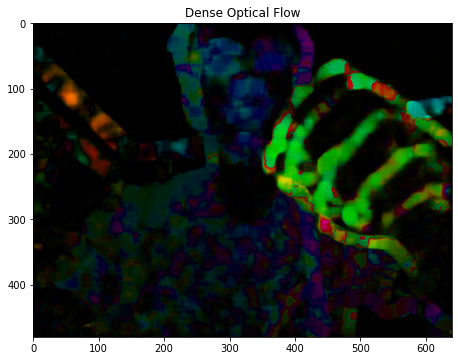

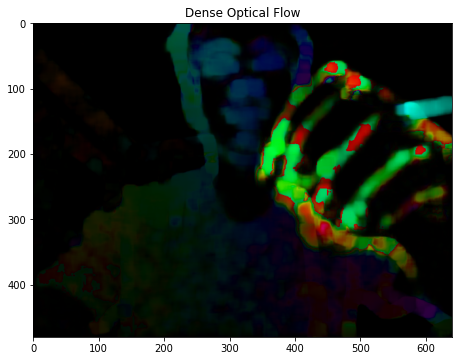

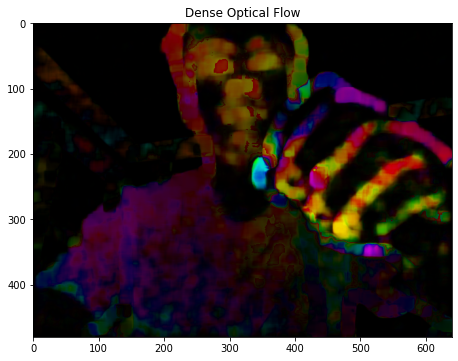

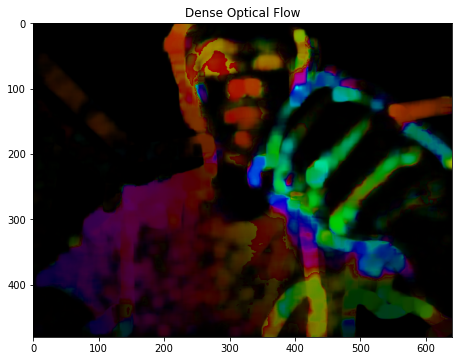

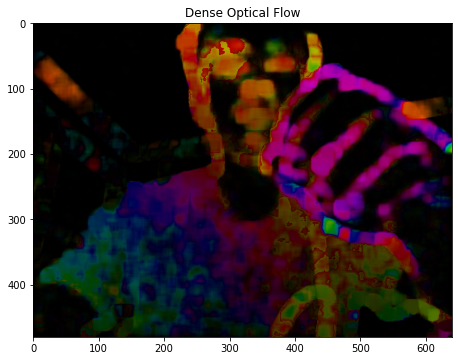

...

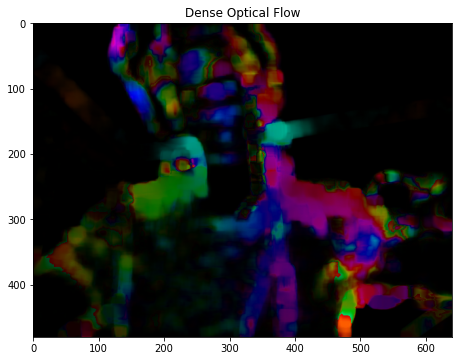

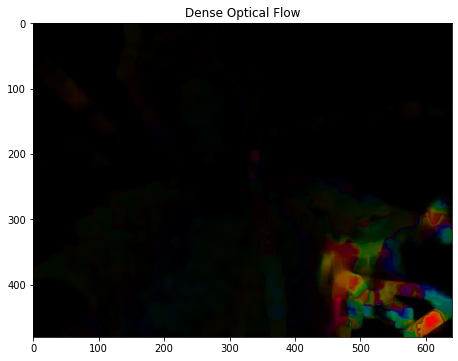

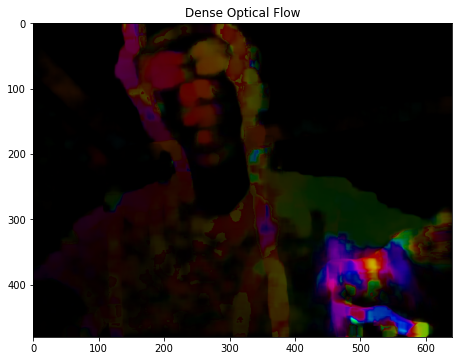

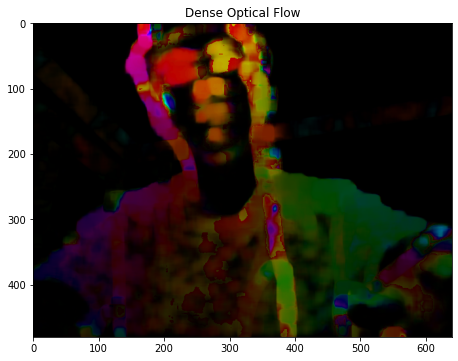

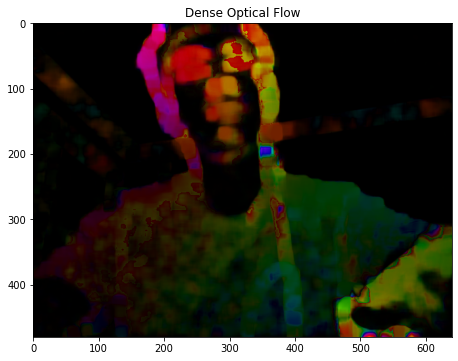

KeyboardInterrupt: 

In [2]:
# Load video stream, long clip
cap = cv2.VideoCapture(0)

# Get the height and width of the frame (required to be an interger)
width = int(cap.get(3)) 
height = int(cap.get(4))

# Get first frame
ret, first_frame = cap.read()
previous_gray = cv2.cvtColor(first_frame, cv2.COLOR_BGR2GRAY)
hsv = np.zeros_like(first_frame)
hsv[...,1] = 255 #1 indexdagi col barchasi oq ranga tenglanyapti. 

while True:
    
    # Read of video file
    ret, frame2 = cap.read()

    if ret == True:
        next_ = cv2.cvtColor(frame2,cv2.COLOR_BGR2GRAY)

        # Computes the dense optical flow using the Gunnar Farneback’s algorithm
        flow = cv2.calcOpticalFlowFarneback(previous_gray, next_, 
                                            None, 0.5, 3, 15, 3, 5, 1.2, 0)

        # use flow to calculate the magnitude (speed) and angle of motion
        # use these values to calculate the color to reflect speed and angle
        magnitude, angle = cv2.cartToPolar(flow[...,0], flow[...,1])
        hsv[...,0] = angle * (180 / (np.pi/2))
        hsv[...,2] = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)
        final = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

        # Show our demo of Dense Optical Flow
        imshow('Dense Optical Flow', final)
        cv2.imshow('Dense Optical Flow', final)

        # Store current image as previous image
        previous_gray = next_
        
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    else:
          break
    
cap.release()
cv2.destroyAllWindows()